In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from math import exp, pi
import os

%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 10)

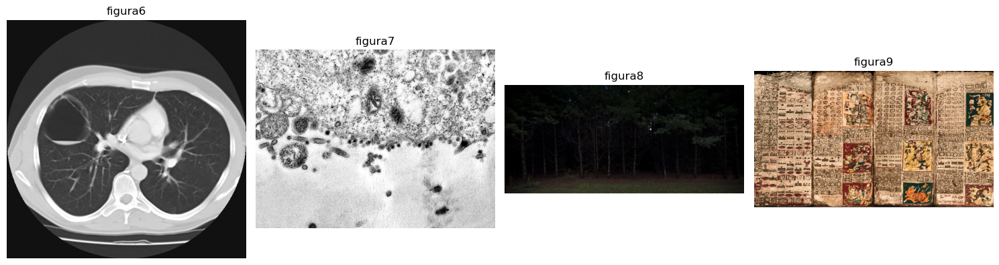

In [2]:
def load_and_display_images():
    current_dir = os.path.dirname(os.path.abspath('__file__'))
    input_dir = os.path.join(current_dir, r'Documents\digital_image_processing\P2_Border_detection\Input')
    output_dir = os.path.join(current_dir, r'Documents\digital_image_processing\P2_Border_detection\Output')
    
    os.makedirs(input_dir, exist_ok=True)
    os.makedirs(output_dir, exist_ok=True)
    
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(input_dir)
                  if f.lower().endswith(valid_extensions)]
    
    images = {}
    fig, axes = plt.subplots(1, len(image_files), figsize=(15, 5))
    
    if len(image_files) == 1:
        axes = [axes]
    
    for i, filename in enumerate(image_files):
        img_path = os.path.join(input_dir, filename)
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        name = os.path.splitext(filename)[0]
        images[name] = {
            'bgr': img,
            'rgb': img_rgb
        }
        
        axes[i].imshow(img_rgb)
        axes[i].set_title(name)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return images

images = load_and_display_images()

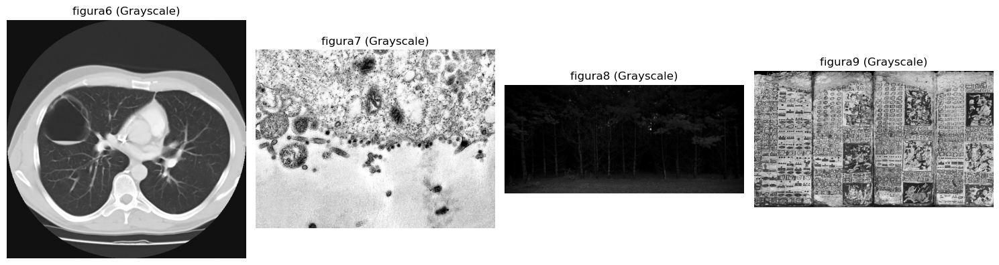

In [3]:
def preprocess_images(images):
    preprocessed = {}
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    
    for i, (name, img_dict) in enumerate(images.items()):
        gray = cv2.cvtColor(img_dict['bgr'], cv2.COLOR_BGR2GRAY)
        
        preprocessed[name] = gray
        
        axes[i].imshow(gray, cmap='gray')
        axes[i].set_title(f"{name} (Grayscale)")
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return preprocessed

gray_images = preprocess_images(images)

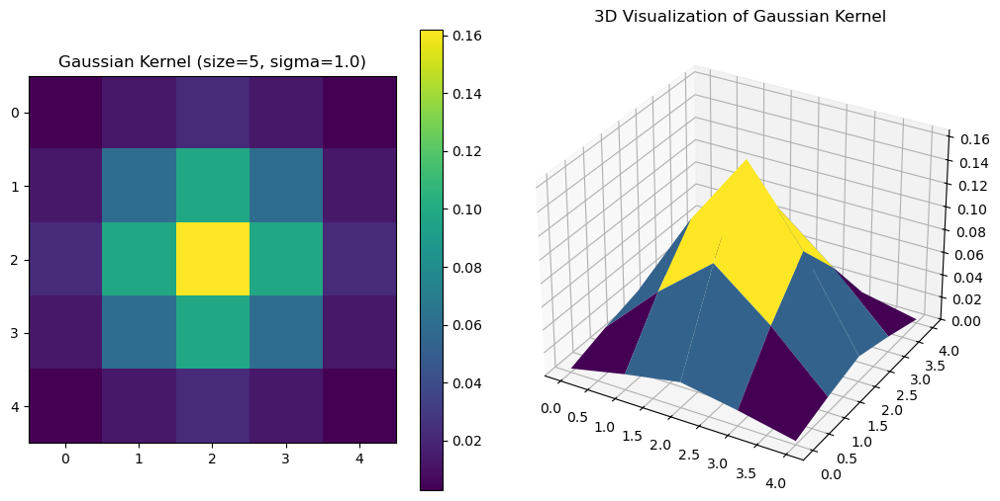

In [4]:
def create_gaussian_kernel(size, sigma):
    if size % 2 == 0:
        size += 1
    
    kernel = np.zeros((size, size))
    center = size // 2
    norm_factor = 1 / (2 * pi * sigma**2)
    
    for i in range(size):
        for j in range(size):
            x = i - center
            y = j - center
            
            exponent = -(x**2 + y**2) / (2 * sigma**2)
            kernel[i, j] = norm_factor * exp(exponent)
    
    return kernel / np.sum(kernel)

def apply_gaussian_filter(image, kernel):
    img_height, img_width = image.shape
    k_height, k_width = kernel.shape
    
    pad_height = k_height // 2
    pad_width = k_width // 2
    
    padded_img = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='reflect')
    
    output = np.zeros_like(image, dtype=np.float64)
    
    for i in range(img_height):
        for j in range(img_width):
            roi = padded_img[i:i+k_height, j:j+k_width]
            output[i, j] = np.sum(roi * kernel)
    
    return np.clip(output, 0, 255).astype(np.uint8)

kernel_size = 5
sigma = 1.0
kernel = create_gaussian_kernel(kernel_size, sigma)

plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow(kernel, cmap='viridis')
plt.title(f"Gaussian Kernel (size={kernel_size}, sigma={sigma})")
plt.colorbar()

from mpl_toolkits.mplot3d import Axes3D
x = np.linspace(0, kernel_size-1, kernel_size)
y = np.linspace(0, kernel_size-1, kernel_size)
X, Y = np.meshgrid(x, y)

ax = plt.subplot(122, projection='3d')
ax.plot_surface(X, Y, kernel, cmap='viridis')
ax.set_title('3D Visualization of Gaussian Kernel')
plt.tight_layout()
plt.show()

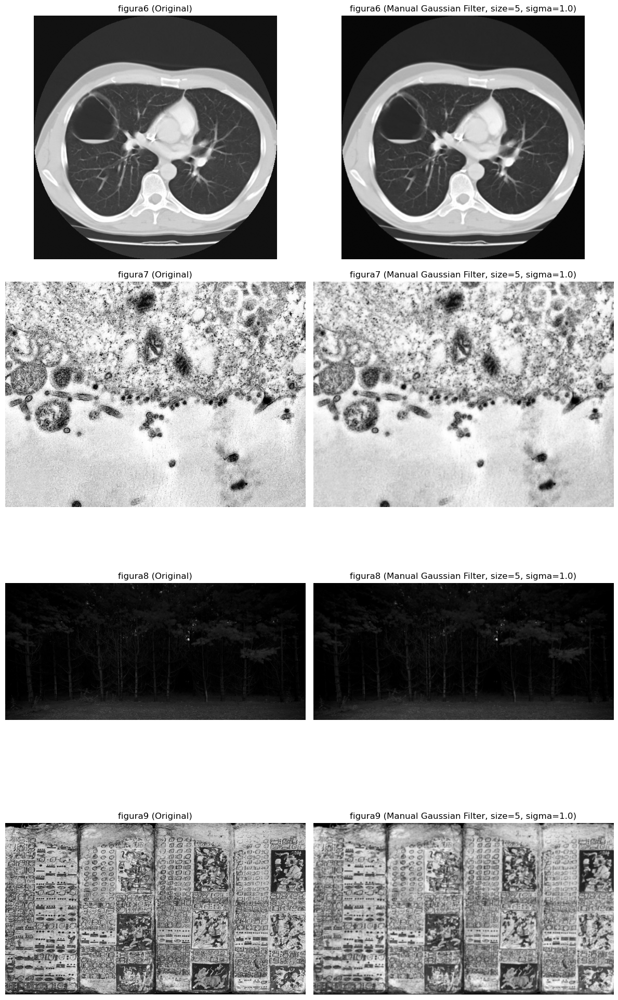

In [5]:
def apply_manual_gaussian(gray_images, kernel_size=5, sigma=1.0):
    kernel = create_gaussian_kernel(kernel_size, sigma)
    
    filtered_images = {}
    fig, axes = plt.subplots(len(gray_images), 2, figsize=(12, 5*len(gray_images)))
    
    for i, (name, img) in enumerate(gray_images.items()):
        filtered = apply_gaussian_filter(img, kernel)
        filtered_images[name] = filtered
        
        axes[i, 0].imshow(img, cmap='gray')
        axes[i, 0].set_title(f"{name} (Original)")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(filtered, cmap='gray')
        axes[i, 1].set_title(f"{name} (Manual Gaussian Filter, size={kernel_size}, sigma={sigma})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return filtered_images

manual_gaussian_images = apply_manual_gaussian(gray_images, kernel_size=5, sigma=1.0)

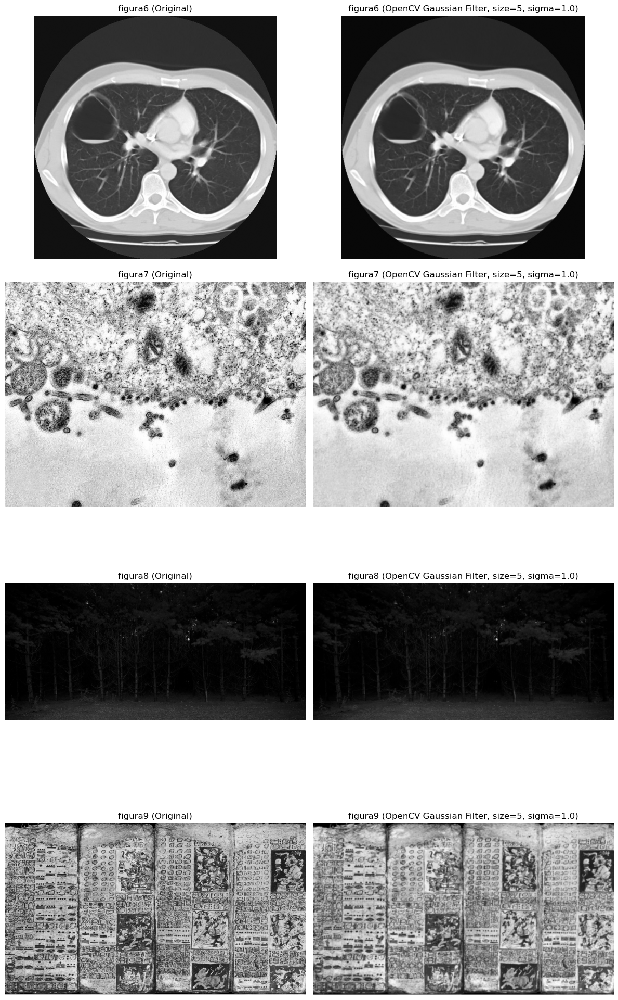

In [6]:
def apply_opencv_gaussian(gray_images, kernel_size=5, sigma=1.0):
    if kernel_size % 2 == 0:
        kernel_size += 1
    
    filtered_images = {}
    fig, axes = plt.subplots(len(gray_images), 2, figsize=(12, 5*len(gray_images)))
    
    for i, (name, img) in enumerate(gray_images.items()):
        filtered = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)
        filtered_images[name] = filtered
        
        axes[i, 0].imshow(img, cmap='gray')
        axes[i, 0].set_title(f"{name} (Original)")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(filtered, cmap='gray')
        axes[i, 1].set_title(f"{name} (OpenCV Gaussian Filter, size={kernel_size}, sigma={sigma})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return filtered_images

opencv_gaussian_images = apply_opencv_gaussian(gray_images, kernel_size=5, sigma=1.0)

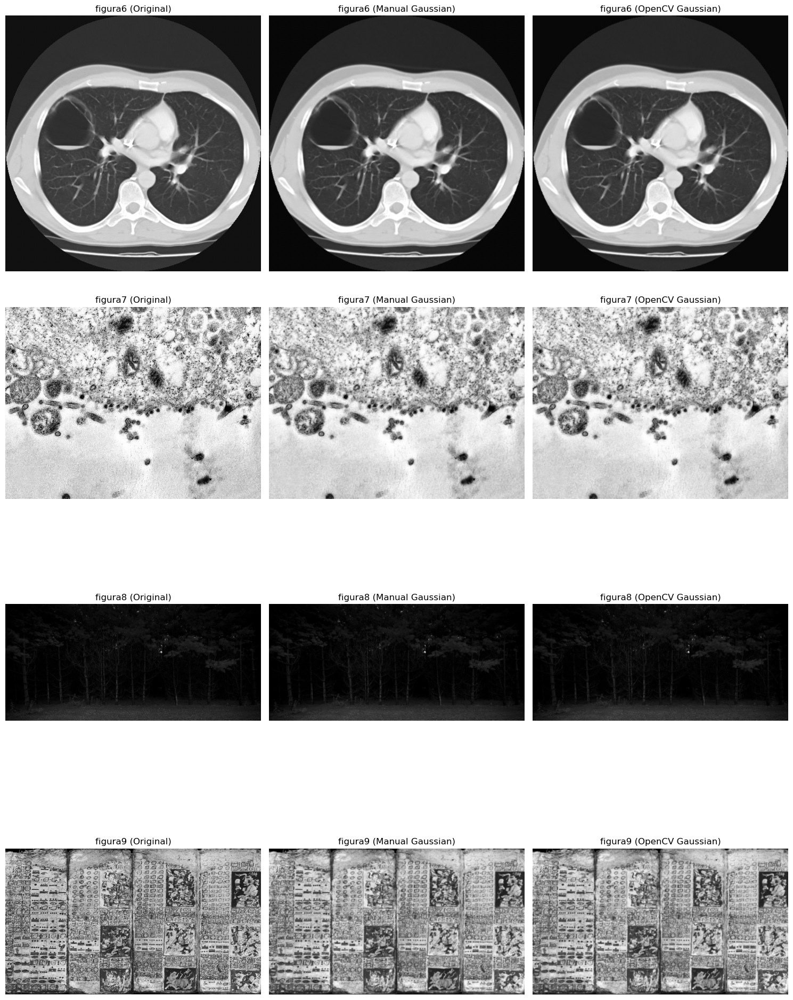

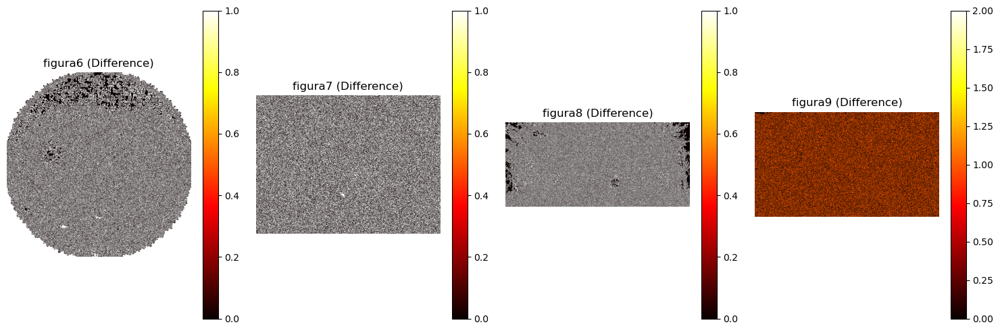

In [7]:
def compare_gaussian_implementations(gray_images, manual_results, opencv_results):
    fig, axes = plt.subplots(len(gray_images), 3, figsize=(15, 5*len(gray_images)))
    
    for i, name in enumerate(gray_images.keys()):
        axes[i, 0].imshow(gray_images[name], cmap='gray')
        axes[i, 0].set_title(f"{name} (Original)")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(manual_results[name], cmap='gray')
        axes[i, 1].set_title(f"{name} (Manual Gaussian)")
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(opencv_results[name], cmap='gray')
        axes[i, 2].set_title(f"{name} (OpenCV Gaussian)")
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    fig, axes = plt.subplots(1, len(gray_images), figsize=(15, 5))
    
    for i, name in enumerate(gray_images.keys()):
        diff = cv2.absdiff(manual_results[name], opencv_results[name])
        
        im = axes[i].imshow(diff, cmap='hot')
        axes[i].set_title(f"{name} (Difference)")
        axes[i].axis('off')
        
        plt.colorbar(im, ax=axes[i])
    
    plt.tight_layout()
    plt.show()

compare_gaussian_implementations(gray_images, manual_gaussian_images, opencv_gaussian_images)

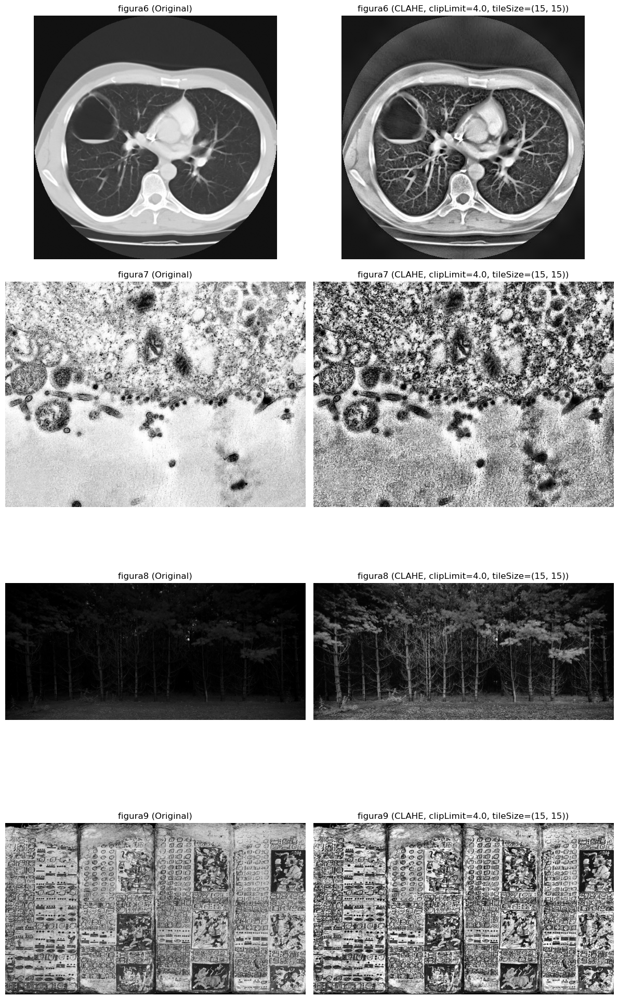

C:\Users\bglobalit\AppData\Local\Temp\ipykernel_20128\3598081599.py:31: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  ax_hist[0].hist(img.ravel(), 256, [0, 256], color='gray')
C:\Users\bglobalit\AppData\Local\Temp\ipykernel_20128\3598081599.py:35: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  ax_hist[1].hist(clahe_img.ravel(), 256, [0, 256], color='gray')


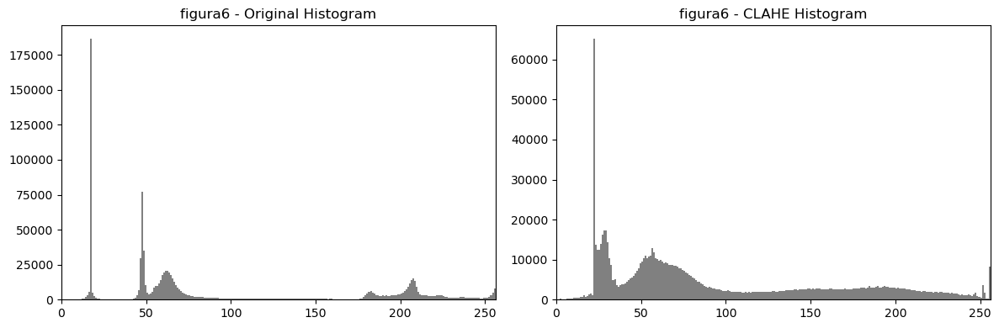

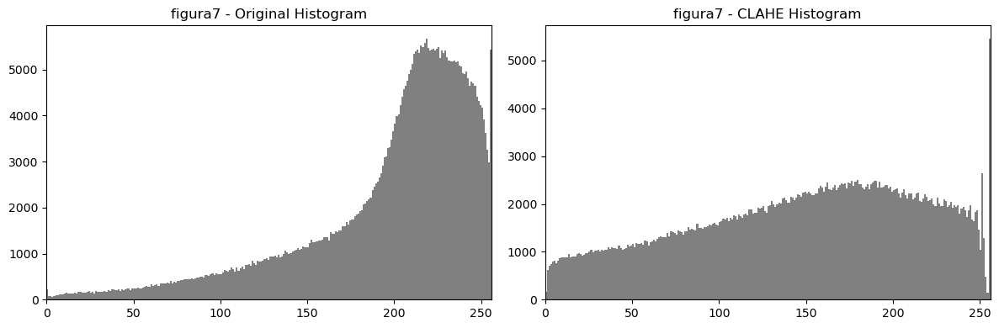

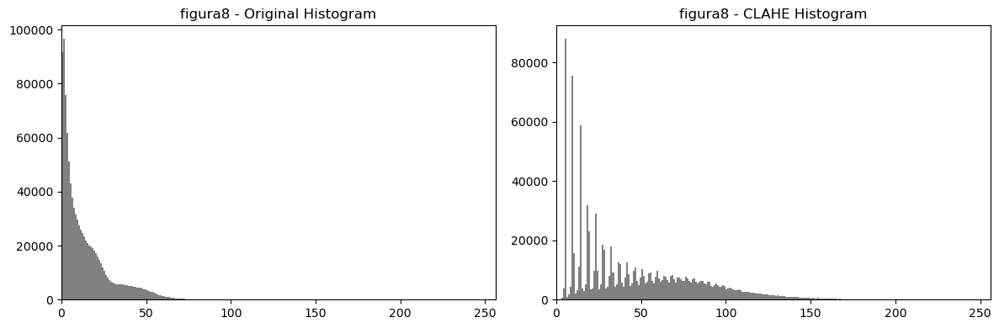

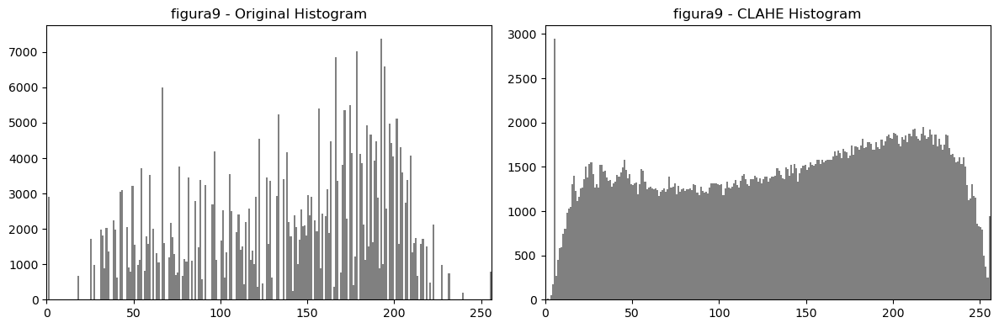

In [8]:
def apply_clahe(gray_images, clip_limit=2.0, tile_size=(8, 8)):
    clahe_images = {}
    
    fig, axes = plt.subplots(len(gray_images), 2, figsize=(12, 5*len(gray_images)))
    
    if len(gray_images) == 1:
        axes = np.array([axes])
    
    for i, (name, img) in enumerate(gray_images.items()):
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
        
        clahe_img = clahe.apply(img)
        clahe_images[name] = clahe_img
        
        axes[i, 0].imshow(img, cmap='gray')
        axes[i, 0].set_title(f"{name} (Original)")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(clahe_img, cmap='gray')
        axes[i, 1].set_title(f"{name} (CLAHE, clipLimit={clip_limit}, tileSize={tile_size})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    for name, img in gray_images.items():
        clahe_img = clahe_images[name]
        
        fig_hist, ax_hist = plt.subplots(1, 2, figsize=(12, 4))
        
        ax_hist[0].hist(img.ravel(), 256, [0, 256], color='gray')
        ax_hist[0].set_title(f"{name} - Original Histogram")
        ax_hist[0].set_xlim([0, 256])
        
        ax_hist[1].hist(clahe_img.ravel(), 256, [0, 256], color='gray')
        ax_hist[1].set_title(f"{name} - CLAHE Histogram")
        ax_hist[1].set_xlim([0, 256])
        
        plt.tight_layout()
        plt.show()
    
    return clahe_images

clahe_images = apply_clahe(gray_images, clip_limit=4.0, tile_size=(15, 15))

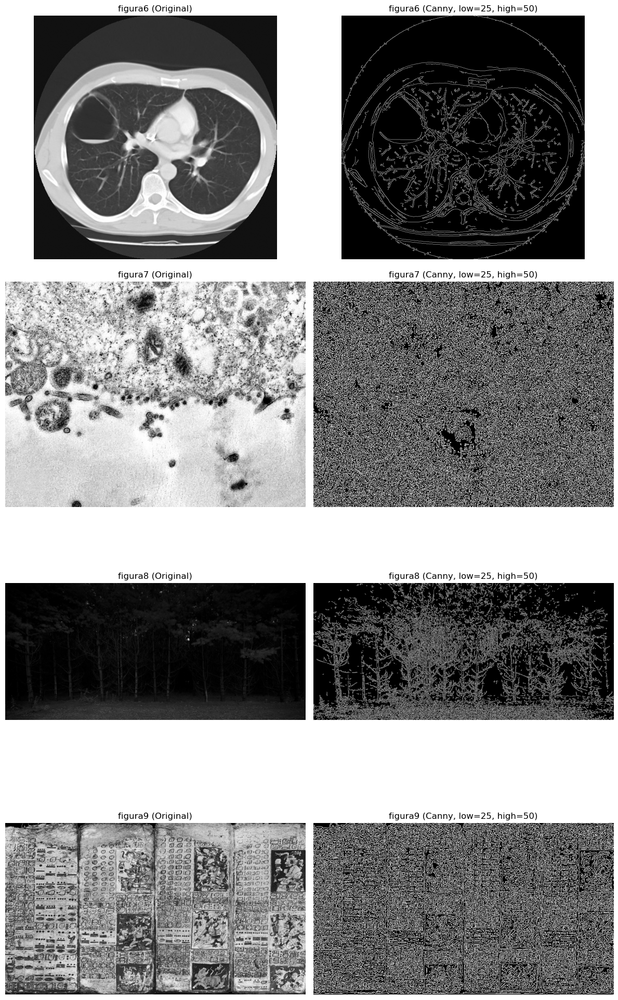

In [9]:
def apply_canny(gray_images, low_threshold=50, high_threshold=150, aperture_size=3):
    canny_images = {}
    fig, axes = plt.subplots(len(gray_images), 2, figsize=(12, 5*len(gray_images)))
    
    for i, (name, img) in enumerate(gray_images.items()):
        edges = cv2.Canny(img, low_threshold, high_threshold, apertureSize=aperture_size)
        canny_images[name] = edges
        
        axes[i, 0].imshow(img, cmap='gray')
        axes[i, 0].set_title(f"{name} (Original)")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(edges, cmap='gray')
        axes[i, 1].set_title(f"{name} (Canny, low={low_threshold}, high={high_threshold})")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return canny_images

canny_images = apply_canny(gray_images, low_threshold=25, high_threshold=50)

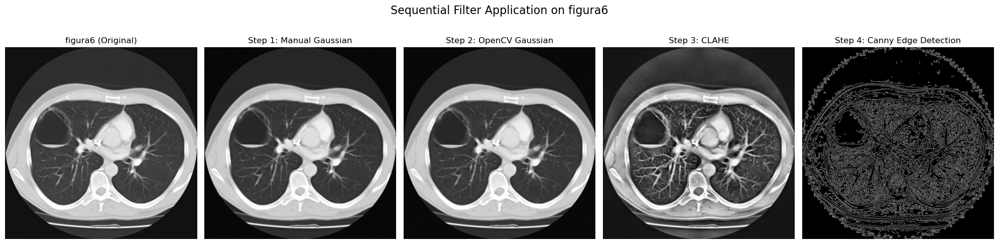

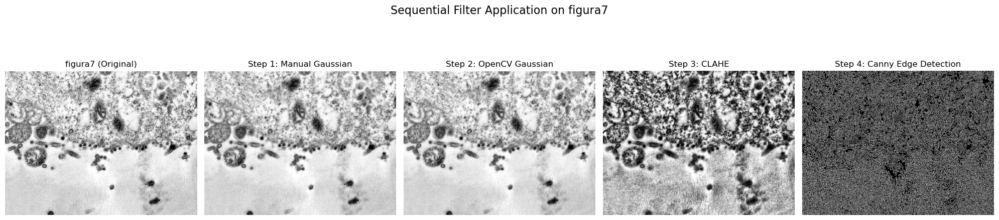

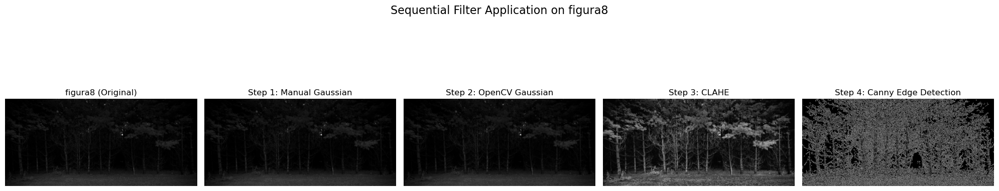

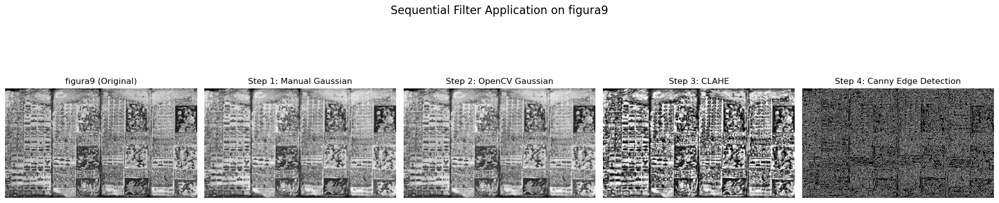

In [10]:
def apply_filter_sequence(gray_images):
    gaussian_kernel_size = 5
    gaussian_sigma = 1.0
    clahe_clip_limit = 4.0
    clahe_tile_size = (15, 15)
    canny_low = 25
    canny_high = 50
    
    for name, img in gray_images.items():
        fig, axes = plt.subplots(1, 5, figsize=(20, 5))
        
        axes[0].imshow(img, cmap='gray')
        axes[0].set_title(f"{name} (Original)")
        axes[0].axis('off')
        
        kernel = create_gaussian_kernel(gaussian_kernel_size, gaussian_sigma)
        manual_gaussian = apply_gaussian_filter(img, kernel)
        axes[1].imshow(manual_gaussian, cmap='gray')
        axes[1].set_title(f"Step 1: Manual Gaussian")
        axes[1].axis('off')
        
        opencv_gaussian = cv2.GaussianBlur(img, (gaussian_kernel_size, gaussian_kernel_size), gaussian_sigma)
        axes[2].imshow(opencv_gaussian, cmap='gray')
        axes[2].set_title(f"Step 2: OpenCV Gaussian")
        axes[2].axis('off')
        
        clahe = cv2.createCLAHE(clipLimit=clahe_clip_limit, tileGridSize=clahe_tile_size)
        clahe_img = clahe.apply(opencv_gaussian)
        axes[3].imshow(clahe_img, cmap='gray')
        axes[3].set_title(f"Step 3: CLAHE")
        axes[3].axis('off')
        
        edges = cv2.Canny(clahe_img, canny_low, canny_high)
        axes[4].imshow(edges, cmap='gray')
        axes[4].set_title(f"Step 4: Canny Edge Detection")
        axes[4].axis('off')
        
        plt.tight_layout()
        plt.suptitle(f"Sequential Filter Application on {name}", fontsize=16, y=1.05)
        plt.show()

apply_filter_sequence(gray_images)